# SLT-CE-3: Histogram Clustering

In this coding exercise, you will segment an image with histogram clustering (HC). You will implement two different methods: maximum a posterior probability (MAP) and deterministic annealing (DA) for predicting the cluster membership for each pixel.

<h2 style="background-color:#f0b375;"> References </h2>

[1] Histogram clustering for unsupervised image segmentation: http://ieeexplore.ieee.org/document/784981 

[2] Lecture Slides 5: https://ml2.inf.ethz.ch/courses/slt/lectures/slt21_lecture05.pdf

[3] Lecture script: https://ml2.inf.ethz.ch/courses/slt/tutorials/SLT_Script.pdf, chapter 2.7

<h2 style="background-color:#f0b375;"> Setup </h2>

In [2]:
import sklearn as skl
import matplotlib.pyplot as plt
import numpy as np

from sklearn.utils.validation import check_is_fitted
from sklearn.feature_extraction import image
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.cluster import KMeans
from scipy.optimize import linear_sum_assignment
from matplotlib.image import imread

## Texture and corresponding label map
(This texture is used to fit your model.)

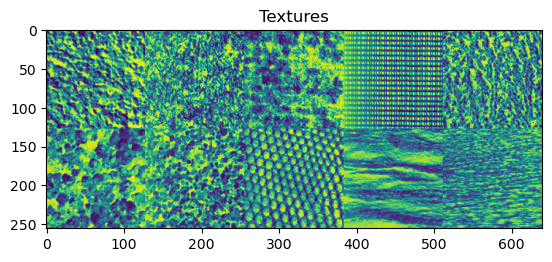

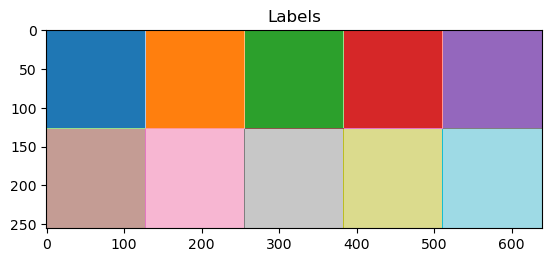

In [3]:
texture = imread("texture.png")

patch_grid_shape = (2, 5)
patch_shape = (128, 128)
label_map = np.ones(texture.shape)
for patch in range(np.prod(patch_grid_shape)):
    i, j = np.unravel_index(patch, patch_grid_shape)
    label_map[patch_shape[0] * i:patch_shape[0] * (i + 1), \
              patch_shape[1] * j:patch_shape[1] * (j + 1)] = np.ravel_multi_index((i, j), patch_grid_shape)

plt.imshow(texture)
plt.title("Textures")
plt.figure()
plt.imshow(label_map, cmap="tab20")
plt.title("Labels")
plt.show()

## Permuted texture and label map
(The permuted texture is used for the prediction)

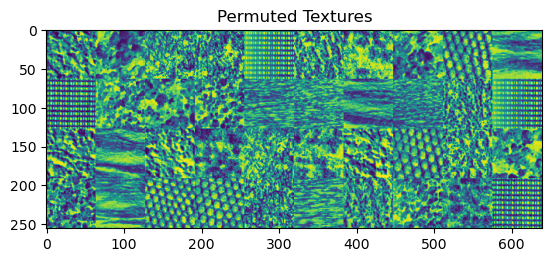

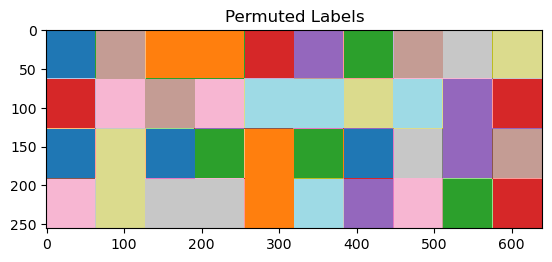

In [4]:
perm_patch_grid_shape = tuple(i * 2 for i in patch_grid_shape)
perm_patch_shape = tuple(i // 2 for i in patch_shape)
n_perm_patches = np.prod(patch_grid_shape) * 4

np.random.seed(5)
perm = np.random.permutation(n_perm_patches)

perm_texture = np.ones(texture.shape)
perm_label_map = np.ones(texture.shape)

for patch, perm_patch in enumerate(perm):
    i, j = np.unravel_index(patch, perm_patch_grid_shape) * np.array(perm_patch_shape)
    ip, jp = np.unravel_index(perm_patch, perm_patch_grid_shape) * np.array(perm_patch_shape)

    perm_texture[ip:ip + perm_patch_shape[0], jp:jp + perm_patch_shape[1]] \
        = texture[i:i + perm_patch_shape[0], j:j + perm_patch_shape[1]]

    perm_label_map[ip:ip + perm_patch_shape[0], jp:jp + perm_patch_shape[1]] \
        = label_map[i:i + perm_patch_shape[0], j:j + perm_patch_shape[1]]

plt.imshow(perm_texture)
plt.title("Permuted Textures")
plt.figure()
plt.imshow(perm_label_map, cmap="tab20")
plt.title("Permuted Labels")
plt.show()

<h2 style="background-color:#f0b375;">
Section 4.0 
<span style=font-size:50%> Complete all problems in this section to get a pass on this exercise. </span>
</h2>

<p style="background-color:#adebad;">
    Read the references and recapitulate the parameter estimation formulas for both: maximum a posteriori probability estimation (MAP) and Deterministic Annealing (DA) estimation. In particular, write down how equation (5) in reference <a href=http://ieeexplore.ieee.org/document/784981>[1]</a> looks for the case of DA (using the notation of reference [1]).<br>
Hint: try to derive $\hat P(y|c)$ from $\hat P(c|x)$ and use the maximum entropy principle to find $\hat P(c|x)$.
</p>

Put your recap here.

In the case of DA, equation (5) becomes $\hat{P}(y|c)= \frac{\sum_i \hat{P}(y|x_i) \hat{P}(c|x_i)}{\sum_i \hat{P}(c|x_i)}$ where $ \hat{P}(c|x) = \frac {\exp(- D_{KL}(\hat P(y|x)|| \hat{P}(y|c)))}{\sum_k \exp(- D_{KL}(\hat{P}(y|x)|| \hat{P}(y|k)))}$ and $D_{KL}(\hat{P}(y|x) || \hat{P}(y|c)) = \sum_{j=1}^m \hat{P}(y_j|x) \log\frac{\hat{P}(y_j|x)}{\hat{P}(y_j|c)}$

In [26]:
def match_cluster_labels(matrix1, matrix2, num_clusters=10):
    
    # Flatten the matrices
    matrix1_flat = np.reshape(matrix1, (-1,))
    matrix2_flat = np.reshape(matrix2, (-1,))
    
    # Calculate cost matrix
    cost_matrix = np.zeros((num_clusters, num_clusters), dtype=int)

    for cluster in range(num_clusters):
        matrix2_indices = np.where(matrix2_flat == cluster)[0]
        matrix1_indices_list = np.array([np.where(matrix1_flat == i)[0] for i in range(num_clusters)])
        intersections = np.array([np.intersect1d(matrix2_indices, matrix1_indices).size for matrix1_indices in matrix1_indices_list])
        cost_matrix[cluster, :] = intersections

    inverted_cost_matrix = np.max(cost_matrix) - cost_matrix

    # Perform Hungarian algorithm 
    row_ind, col_ind = linear_sum_assignment(inverted_cost_matrix)
    cluster_mapping = dict(zip(row_ind, col_ind))


    # Remap labels in second matrix
    remapped_matrix2 = matrix2_flat.copy()
    for cluster in range(num_clusters):
        remapped_matrix2[matrix2_flat == cluster] = cluster_mapping[cluster]

    # Reshape remapped matrix to original
    remapped_matrix2 = np.reshape(remapped_matrix2, matrix2.shape)

    return remapped_matrix2, cluster_mapping

In [56]:
class HistogramClustering(skl.base.BaseEstimator, skl.base.TransformerMixin):
    """Template class for HistogramClustering (HC)
    
    Attributes:
        centroids (np.ndarray): Array of centroid distributions p(y|c) with shape (n_clusters, n_bins).
        
    Parameters:
        n_clusters (int): Number of clusters (textures).
        n_bins (int): Number of bins used to discretize the range of pixel values found in input image X.
        window_size (int): Size of the window used to compute the local histograms for each pixel.
                           Should be an odd number larger or equal to 3.
        random_state (int): Random seed.
        estimation (str): Whether to use Maximum a Posteriori ("MAP") or
                          Deterministic Annealing ("DA") estimation.
    """
    
    def __init__(self, n_clusters=10, n_bins=64, window_size=15, random_state=42, estimation="MAP", T = 100, T_min = 1, alpha = 0.9, plot_clust = False):
        self.n_clusters = n_clusters
        self.n_bins =n_bins
        self.window_size = window_size
        self.random_state = random_state
        self.estimation = estimation
        self.centroids = None
        self.cluster_assign = None
        self.histograms = None
        self.assign_probs = None
        self.T = T
        self.T_min = T_min
        self.alpha = alpha
        self.plot_clust = plot_clust

    def create_patches(self, X):

        # Get Image data
        height, width = X.shape[0], X.shape[1]
        self.n_pix = height * width
        
        # Padding
        pad_width = int(self.window_size / 2 -0.5)
        X_padded = np.pad(X, ((pad_width,  pad_width), (pad_width, pad_width)), 'constant', constant_values=-0.1)
        
        # Calculate Patches based on window size
        patches = image.extract_patches_2d(X_padded, (self.window_size, self.window_size))
        patches = np.reshape(patches, (self.n_pix, self.window_size**2))

        return patches

    
    def create_hist(self, X):
        hist, _ = np.histogram(X[X>=0], bins=np.linspace(0,1,self.n_bins+1))
        return hist / np.sum(hist)
        
    
    def fit(self, X):
        """Compute HC for input image X
        
        Compute centroids.        
        
        Args:
            X (np.ndarray): Input array with shape (height, width)
        
        Returns:
            self
        """

        # Create histograms
        patches = self.create_patches(X)
        self.histograms = np.apply_along_axis(self.create_hist, 1, patches)
        
        if self.estimation == "MAP":

            # Initialize centroids
            self.centroids = np.zeros((self.n_clusters, self.n_bins))
            for i in range(self.n_clusters):
                self.centroids[i] = np.random.rand(self.n_bins)
                self.centroids[i] /= np.sum(self.centroids[i])

            # Intialize cluster assignments
            self.cluster_assign = np.zeros((self.n_pix, 1))
            self.cluster_assign = np.argmin(-np.sum(self.histograms[:, np.newaxis, :]
                                                    * np.log(self.centroids[:, :]), axis=2), axis=1).reshape(self.n_pix, 1)

            while True:

                # Save old assignments
                old_centroids = np.copy(self.centroids)

                # Udpate assignments
                self.cluster_assign = np.argmin(-np.sum(self.histograms[:, np.newaxis, :] * 
                                                        np.log(self.centroids[:, :]), axis=2), axis=1).reshape(self.n_pix, 1)

                # Update centroids
                for cluster in range(self.n_clusters):
                    c_index = np.where(self.cluster_assign == cluster)[0]
                    self.centroids[cluster] = np.mean(self.histograms[c_index], axis = 0)

                # Add noise to centroids
                self.centroids = self.centroids + np.random.uniform(1e-9, 1e-8)

                # Ensure centroids stay within bounds
                self.centroids = np.clip(self.centroids, 0, 1)

                # Normalize the centroids
                self.centroids = np.divide(self.centroids, np.sum(self.centroids, axis=1)[:, np.newaxis])

                # Check if distance between previous centers is below threshhold
                if np.linalg.norm(old_centroids - self.centroids) < 1e-6:
                    break
        
        
        elif self.estimation == "DA":
            
            # Initialize centroids
            self.centroids = np.zeros((self.n_clusters, self.n_bins))
            for i in range(self.n_clusters):
                self.centroids[i] = np.mean(self.histograms, axis = 0)
                self.centroids[i] /= np.sum(self.centroids[i])

            # Intialize cluster assignment probabilities
            self.assign_probs = np.ones((self.n_pix, self.n_clusters)) / self.n_clusters
            
            # Check if Temperature is higher than min Temperature
            T_start = self.T
            while self.T > self.T_min:
                
                # Calucate distance between different centroids
                centroid_dist = np.linalg.norm(self.centroids[:, np.newaxis, :] - self.centroids, axis=-1)
                np.fill_diagonal(centroid_dist, np.inf)  # Set diagonal values to infinity to ignore self-distances

                # Find centroid pairs with distances less than epsilon
                i, j = np.where(centroid_dist < 0.0001)

                # Add noise to centroids with distances less than epsilon
                self.centroids[j] += np.random.normal(scale=0.001, size=(len(j), self.centroids.shape[1]))

                # Ensure centroids stay within bounds
                self.centroids = np.clip(self.centroids, 0, 1)

                # Normalize the centroids
                self.centroids = np.divide(self.centroids, np.sum(self.centroids, axis=1)[:, np.newaxis])

                while True:
                    
                    # Save old assignments
                    old_centroids = np.copy(self.centroids)
                    
                    # Udpate assignments probabilites
                    hist_exp, cent_exp = np.expand_dims(self.histograms, 1), np.expand_dims(self.centroids, 0)

                    log_term = np.log(hist_exp / (cent_exp + 1e-8) + 1e-8)
                    weighted_sum = np.sum(hist_exp * log_term, axis=-1)

                    exp_term = np.exp(-(1 / self.T) * weighted_sum)
                    self.assign_probs = exp_term / np.sum(exp_term, axis=-1, keepdims=True)
                
                    # Update cluster centers
                    assign_probs_expanded = self.assign_probs[:, :, np.newaxis] * self.histograms[:, np.newaxis, :]
                    
                    nom = np.sum(assign_probs_expanded, axis=0)
                    den = np.sum(self.assign_probs, axis=0)[:, np.newaxis]
                    
                    self.centroids = nom / den
                    
                    # Check if distance between previous centers is below threshhold
                    if np.linalg.norm(old_centroids - self.centroids) < 1e-4:
                        break
                
                
                # Plot clustering for Temperature step
                if self.plot_clust == True:

                    # Calculate histograms for test set
                    if self.T == T_start:
                        
                        patches = self.create_patches(perm_texture)
                        histograms_test = np.apply_along_axis(self.create_hist, 1, patches)
                    
                    # Predict cluster labels on test set
                    hist_exp, cent_exp = np.expand_dims(histograms_test, 1), np.expand_dims(self.centroids, 0)

                    log_term = np.log(hist_exp / (cent_exp + 1e-8) + 1e-8)
                    weighted_sum = np.sum(hist_exp * log_term, axis=-1)

                    exp_term = np.exp(-(1 / self.T) * weighted_sum)
                    assign_probs = exp_term / np.sum(exp_term, axis=-1, keepdims=True)

                    predicted_perm_label_map = np.argmax(assign_probs, axis=1)
                    predicted_perm_label_map = np.reshape(predicted_perm_label_map, X.shape)
                    
                    # Match labels to ground truth label
                    perm_matched_preds = match_cluster_labels(perm_label_map, predicted_perm_label_map, 10)[0]
                    
                    # Calculate accuracy score
                    acc = accuracy_score(np.reshape(perm_label_map, (-1,)), np.reshape(perm_matched_preds, (-1,)))
                    
                    # Plot true vs predicted labels
                    plt.figure(figsize=(16,4))
                    plt.subplot(121)
                    plt.imshow(perm_label_map, cmap="tab20")
                    plt.title("Ground Truth Labels")
                    plt.subplot(122)
                    plt.imshow(perm_matched_preds, cmap="tab20")
                    plt.title("Predicted Labels, Temperature: {}, Accuracy: {}".format(round(self.T, 2), round(acc, 2)))
                    plt.show()

                # Update temperature
                self.T *= self.alpha 

        return self
    
    def predict(self, X, estimation="MAP"):
        """Predict cluster assignments for each pixel in image X.
        
        Args:
            X (np.ndarray): Input array with shape (height, width)
            
        Returns:
            C (np.ndarray): Assignment map (height, width) 
        """
        check_is_fitted(self, ["centroids"])
        
        # Create histograms
        patches = self.create_patches(X)
        self.histograms_test = np.apply_along_axis(self.create_hist, 1, patches)
        
        if self.estimation == "MAP":
        
            # Calculate assignment map
            C = np.argmin(-np.sum(self.histograms_test[:, np.newaxis, :] * 
                        np.log(self.centroids[:, :]), axis=2), axis=1).reshape(self.n_pix, 1)

            C = np.reshape(C, X.shape)
        
        elif self.estimation == "DA":
            
            # Calculate assignments probabilites
            hist_exp, cent_exp = np.expand_dims(self.histograms_test, 1), np.expand_dims(self.centroids, 0)

            log_term = np.log(hist_exp / (cent_exp + 1e-10) + 1e-10)
            weighted_sum = np.sum(hist_exp * log_term, axis=-1)

            exp_term = np.exp(-(1 / self.T) * weighted_sum)
            assign_probs = exp_term / np.sum(exp_term, axis=-1, keepdims=True)
    
            # Calculate assignment map
            C = np.argmax(assign_probs, axis=1)
            C = np.reshape(C, X.shape)
            
        return C
    
    def generate(self, C):
        """Generate a sample image X from a texture label map C.
        
        The entries of C are integers from the set {1,...,n_clusters}. They represent the texture labels
        of each pixel. Given the texture labels, a sample image X is generated by sampling
        the value of each pixel from the fitted p(y|c).
        
        Args:
            C (np.ndarray): Input array with shape (height, width)
            
        Returns:
            X (np.ndarray): Sample image (height, width)
        """
        check_is_fitted(self, ["centroids"])

        height, width = C.shape
        X = np.zeros(C.shape)
        cluster = int(C[0, 0])
        linspace_values = np.linspace(0, 1, self.n_bins + 1)

        random_indices = np.random.choice(self.centroids[cluster].size, (height, width), 
                                          p = self.centroids[cluster] / np.sum(self.centroids[cluster]))

        X = linspace_values[random_indices]
        
        return X

<p style="background-color:#adebad;">
Implement the "MAP" part of the <b>fit method</b> for the template class HistogramClustering, according to the contract outlined in its docstring. You can add more class methods if necessary. Create an instance of your HC class with n_clusters = 10 and fit the image texture. Record the execution time.
</p>

In [42]:
%%time
HC = HistogramClustering(n_clusters=10, n_bins=128, window_size=15)
HC.fit(texture)
check_is_fitted(HC, ["centroids"])

CPU times: user 29.3 s, sys: 12.7 s, total: 42 s
Wall time: 43.3 s


<h2 style="background-color:#f0b375;">
Section 4.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 4.5 </span>
</h2>

<p style="background-color:#adebad;">
    <ul style="background-color:#adebad;">
        <li> Implement the <b>predict method</b> for the template class HC, according to the contract outlined in its docstring.
        </li>        
        <li>
            Use HC.predict to predict the texture labels of perm_texture. Plot the predicted label map.
        </li>
    </ul>
</p>

In [43]:
%%time
pred_label_map = HC.predict(perm_texture)

CPU times: user 16 s, sys: 1.53 s, total: 17.6 s
Wall time: 18 s


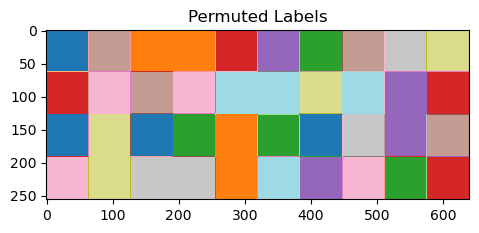

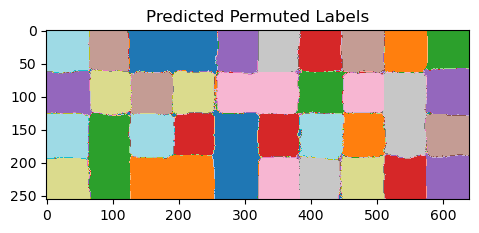

In [44]:
# Plot of predicted label map
plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(perm_label_map, cmap="tab20")
plt.title("Permuted Labels")
plt.show()

plt.figure(figsize=(12,3))
plt.subplot(122)
plt.imshow(pred_label_map, cmap="tab20")
plt.title("Predicted Permuted Labels")
plt.show()

<p style="background-color:#adebad;">
    Plot the confusion matrix for your predictions, using the perm_label_map. Make sure to permute the texture labels appropriately, to make them correspond to the true labels (see Hungarian algortihm to find the best match).
</p>

In [45]:
pred_label_matched = match_cluster_labels(perm_label_map, pred_label_map, 10)[0]

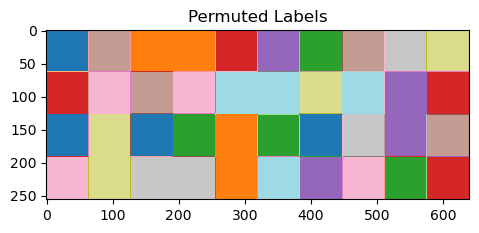

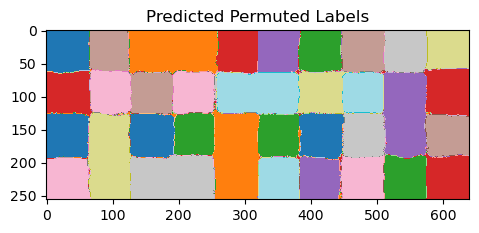

In [46]:
plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(perm_label_map, cmap="tab20")
plt.title("Permuted Labels")
plt.show()

plt.figure(figsize=(12,3))
plt.subplot(122)
plt.imshow(pred_label_matched, cmap="tab20")
plt.title("Predicted Permuted Labels")
plt.show()

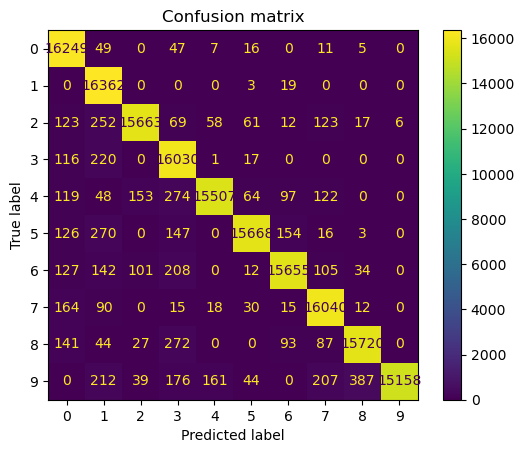

In [47]:
cm = confusion_matrix(np.reshape(perm_label_map, (-1,)), np.reshape(pred_label_matched, (-1,)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion matrix')
plt.show()

In [48]:
accuracy_score(np.reshape(perm_label_map, (-1,)), np.reshape(pred_label_matched, (-1,)))

0.9646728515625

<p style="background-color:#adebad;">
    Using n_clusters=10, fit HC with all combinations of n_bins = 16, 32, 64 and window_size = 7, 9, 11.
    For each setting compute the accuracy of the prediction on perm_texture. Show the results in a 3x3 matrix and label the axes properly.
</p>

In [58]:
# 3x3 Matrix with accuracy scores of the different parameter combination
bins = [16, 32, 64]
wind_size = [7, 9, 11]
acc_score = np.zeros((len(bins), len(wind_size)))
predictions = []

for i, bin in enumerate(bins):
    for j, w_size in enumerate(wind_size):
        HC = HistogramClustering(n_bins= bin, window_size=w_size, estimation="MAP")
        HC.fit(texture)
        pred_label_map = HC.predict(perm_texture)
        pred_label_matched = match_cluster_labels(perm_label_map, pred_label_map, 10)[0]
        acc = accuracy_score(np.reshape(perm_label_map, (-1,)), np.reshape(pred_label_matched, (-1,)))
        acc_score[i, j] = acc
        predictions.append(pred_label_matched)



/var/folders/vn/mllgs9t95s722nyhhjxsd_vr0000gp/T/ipykernel_1902/541817668.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(wind_size)
/var/folders/vn/mllgs9t95s722nyhhjxsd_vr0000gp/T/ipykernel_1902/541817668.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(bins)


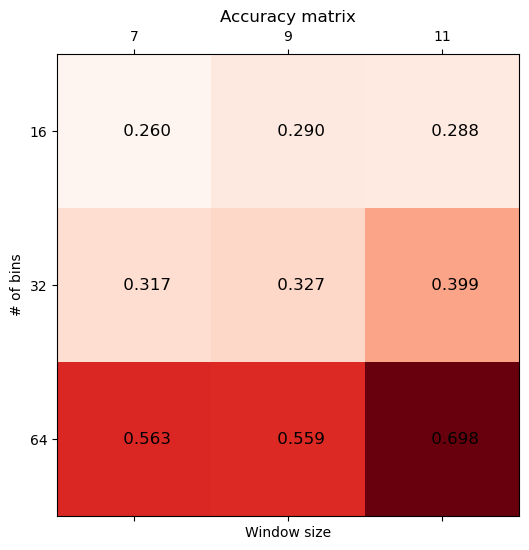

In [59]:
fig, ax = plt.subplots(figsize = (6,6))
ax.matshow(acc_score, cmap=plt.cm.Reds)

image_text = [ax.text(j, i, "{:10.3f}".format(acc_score[i, j]), ha="center", va="center", 
                      color = 'black', fontsize = 'large')
              for i in range(len(bins))
              for j in range(len(wind_size))]
     
        
ax.set_xticklabels(wind_size)
ax.set_xticks(np.arange(len(wind_size)))
ax.set_yticklabels(bins)
ax.set_yticks(np.arange(len(bins)))
ax.set_ylabel('# of bins')
ax.set_xlabel('Window size')
ax.set_title('Accuracy matrix')
plt.show()

<p style="background-color:#adebad;">
    For each setting plot the prediction (i.e. the clustering) of the texture (perm_texture) itself. Arrange the plots next to each other in a grid and label them accordingly.
    </p>

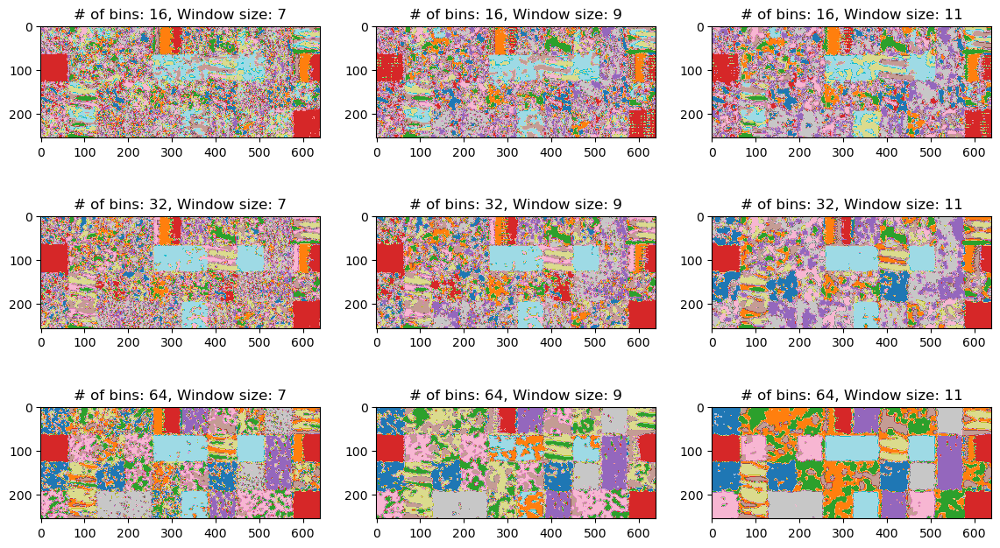

In [60]:
# Cluster predictions (9 plots arranged in a 3x3 grid)
plt.figure(figsize=(14,8))
k = 0
for bin in bins:
    for w_size in wind_size:
        prediction = predictions[k]
        plt.subplot(331 +k)
        plt.imshow(prediction, cmap="tab20")
        plt.title("# of bins: " + str(bin) + ", Window size: " + str(w_size))
        k += 1
plt.show()      

<h2 style="background-color:#f0b375;">
Section 5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5 </span>
</h2>

<ul style="background-color:#adebad;">
        <li> Implement the <b>generate</b> method for the template class HC, according to the contract outlined in its docstring.
        </li>
        <li>
        Use HC.generate to generate ten 128x128 patches, one for each texture. Plot the generated textures next to the ground truth textures.
        </li>
    </ul>

In [61]:
%%time
HC = HistogramClustering(n_clusters=10, n_bins=128, window_size=15, estimation="MAP")
HC.fit(texture)
check_is_fitted(HC, ["centroids"])

CPU times: user 37.9 s, sys: 21.6 s, total: 59.6 s
Wall time: 1min 1s


In [62]:
train_pred = HC.predict(texture)
Cluster_mapping = match_cluster_labels(label_map, train_pred, 10)[1]

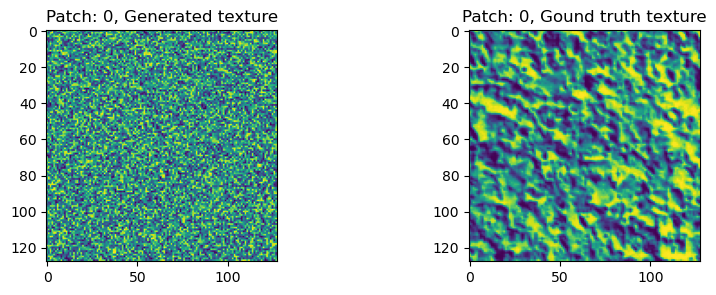

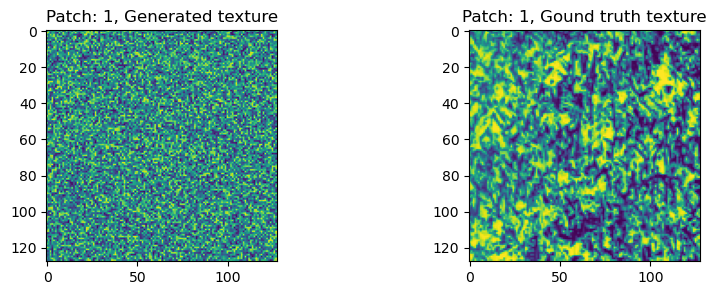

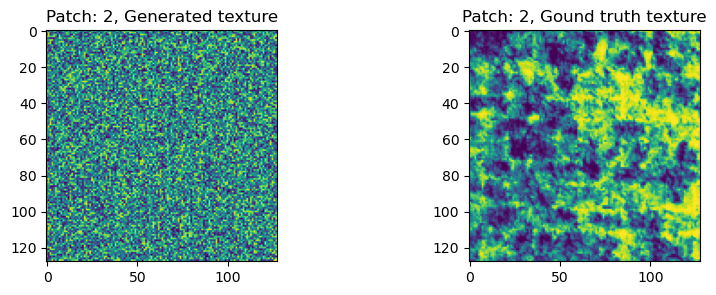

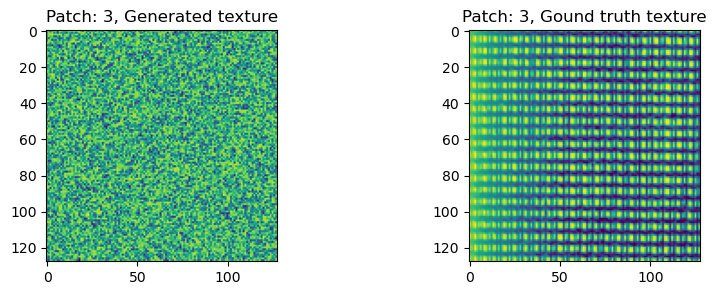

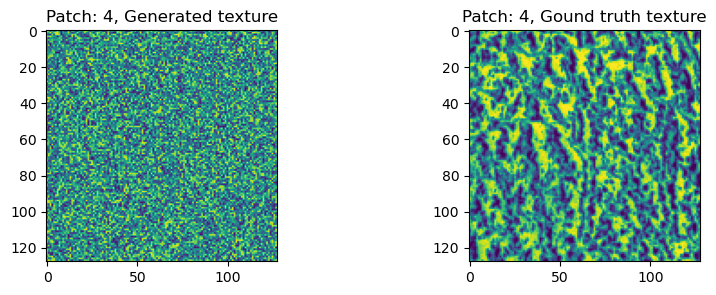

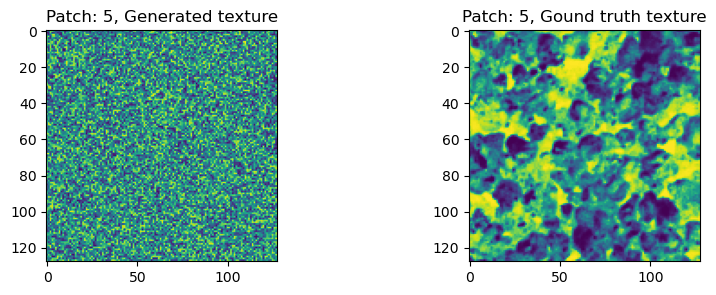

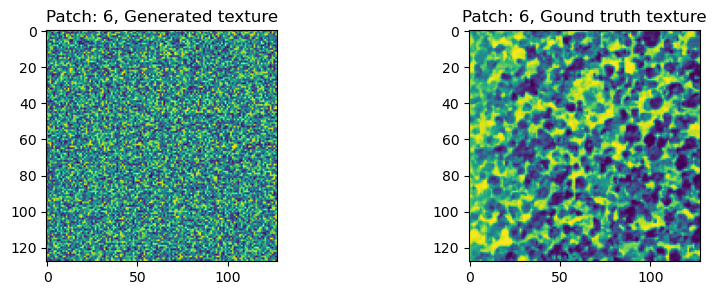

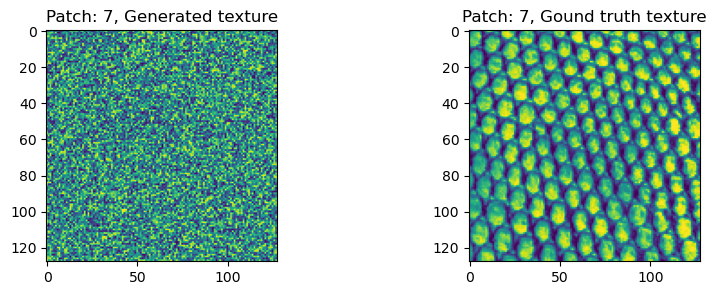

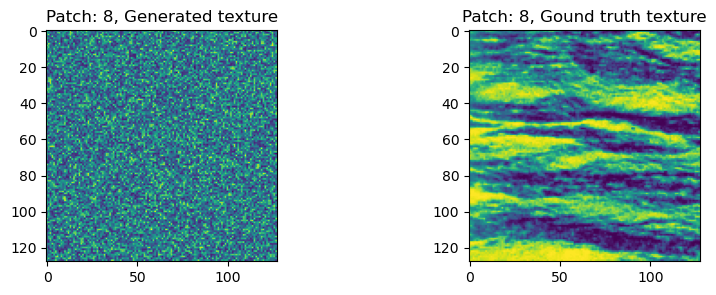

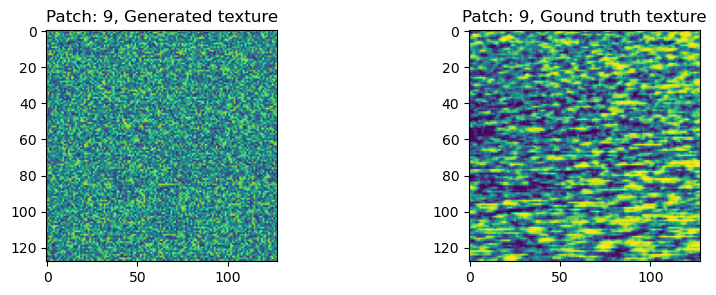

In [63]:
for patch in range(np.prod(patch_grid_shape)):
    i, j = np.unravel_index(patch, patch_grid_shape)
    true_texture = texture[patch_shape[0] * i:patch_shape[0] * (i + 1), patch_shape[1] * j:patch_shape[1] * (j + 1)] 

    C = np.ones(patch_shape, dtype=int) * list(Cluster_mapping.values()).index(patch)
    sampled_texture = HC.generate(C)
    
    plt.figure(figsize=(10,3))
    plt.subplot(121)
    plt.imshow(sampled_texture)
    plt.title('Patch: ' + str(patch) + ', Generated texture')
    plt.subplot(122)
    plt.imshow(true_texture)
    plt.title('Patch: ' + str(patch) + ', Gound truth texture')
    plt.show()

<h2 style="background-color:#f0b375;">
Section 5.5 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 5.5 </span>
</h2>

<ul style="background-color:#adebad;">
    <li>
        Use k-means clustering to cluster the pixels of the texture (perm_texture). Set n_clusters=10, and use the local histogram vectors as features. Compare the predicted label map with k-means with the predicted label map obtained by HC.
    </li>
</ul>

In [64]:
HC = HistogramClustering(n_clusters=10, n_bins=128, window_size=15)
HC.fit(texture)
pred_label_map_HC = HC.predict(perm_texture)

In [65]:
KM = KMeans(n_clusters = 10, random_state = 42)
KM.fit(HC.histograms)
pred_label_map_KM = np.reshape(KM.predict(HC.histograms_test), perm_label_map.shape)

/Users/Yves.Gorgen/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [66]:
pred_label_matched_HC, cluster_map_hc = match_cluster_labels(perm_label_map, pred_label_map_HC, 10)
pred_label_matched_KM, cluster_map_km = match_cluster_labels(perm_label_map, pred_label_map_KM, 10)

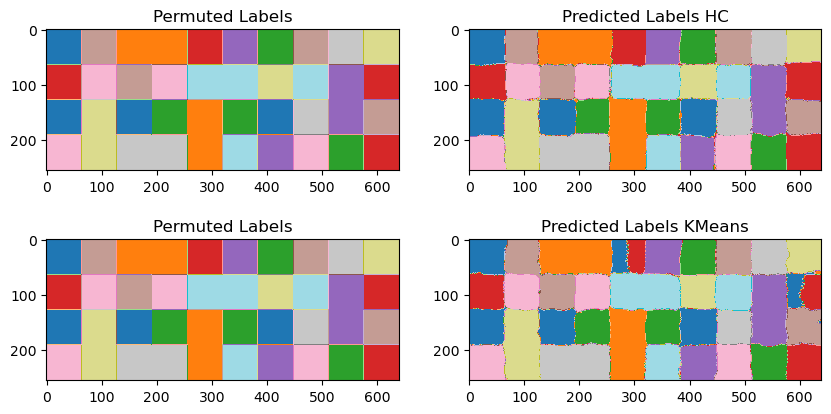

In [67]:
plt.figure(figsize=(10,5))
plt.subplot(221)
plt.imshow(perm_label_map, cmap="tab20")
plt.title("Permuted Labels")

plt.subplot(222)
plt.imshow(pred_label_matched_HC, cmap="tab20")
plt.title("Predicted Labels HC")

plt.subplot(223)
plt.imshow(perm_label_map, cmap="tab20")
plt.title("Permuted Labels")

plt.subplot(224)
plt.imshow(pred_label_matched_KM , cmap="tab20")
plt.title("Predicted Labels KMeans")
plt.show()

<ul style="background-color:#adebad;">
    <li>
        Plot and compare the confusion matrices for both, k-means, and HC.
    </li>
</ul>

In [68]:
pred_HC = np.reshape(pred_label_matched_HC, (-1,))
pred_KM = np.reshape(pred_label_matched_KM, (-1,))
y_true = np.reshape(perm_label_map, (-1,))

In [69]:
print(accuracy_score(y_true, pred_HC))
print(accuracy_score(y_true, pred_KM))

0.9645751953125
0.950701904296875


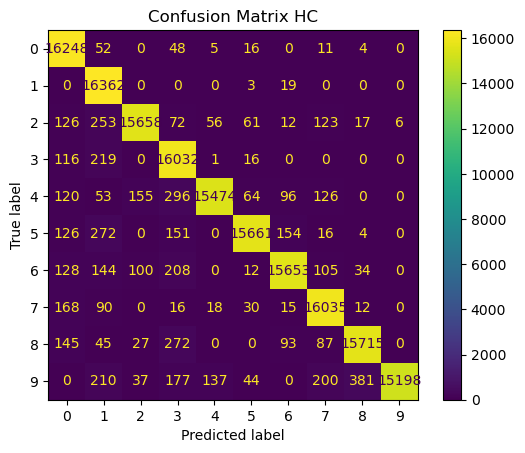

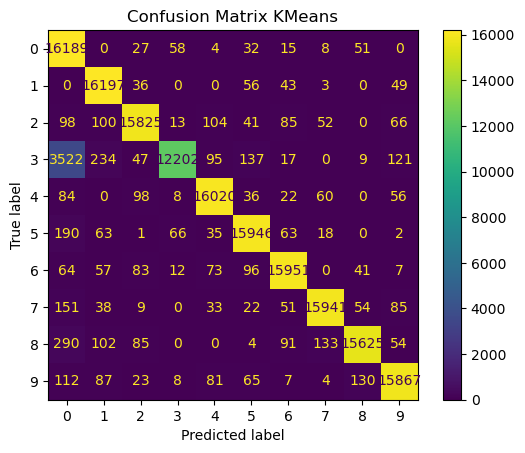

In [70]:
cm_HC = confusion_matrix(y_true, pred_HC)
cm_KM = confusion_matrix(y_true, pred_KM)
disp_HC = ConfusionMatrixDisplay(confusion_matrix=cm_HC)
disp_KM = ConfusionMatrixDisplay(confusion_matrix=cm_KM)
disp_HC.plot()
plt.title('Confusion Matrix HC')
plt.show()
disp_KM.plot()
plt.title('Confusion Matrix KMeans')
plt.show()

<ul style="background-color:#adebad;">
        <li>
Plot the centroid histograms $\hat P(y|c)$ after fitting the texture image, one centroid histogram for every texture image. Compare them to the empirical histograms (i.e. show them both in one plot).
        </li>
    </ul>

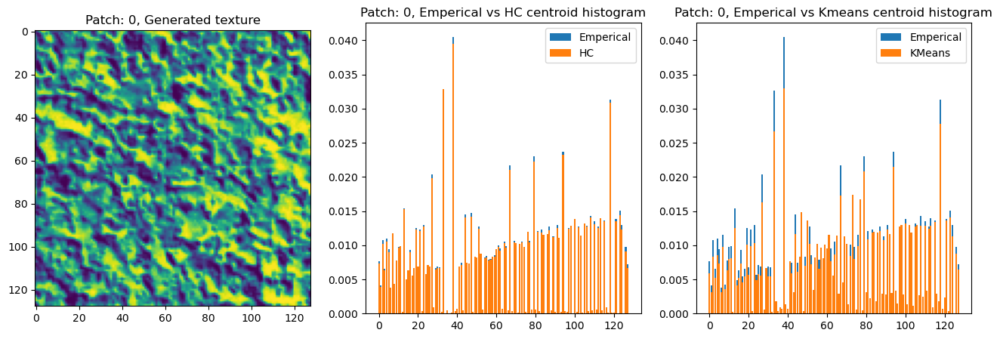

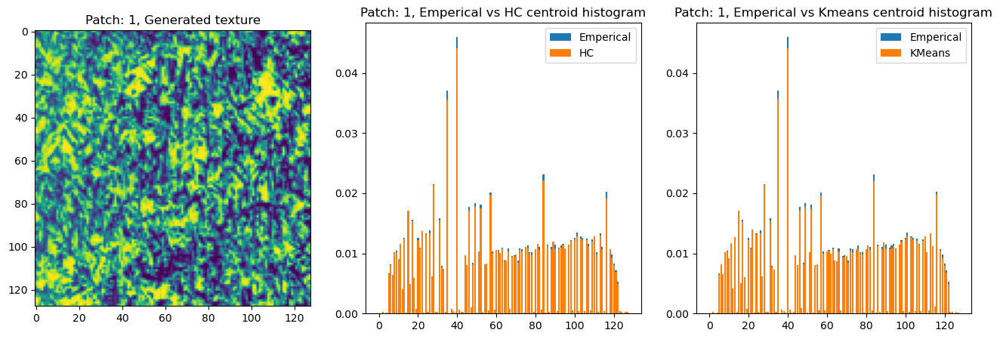

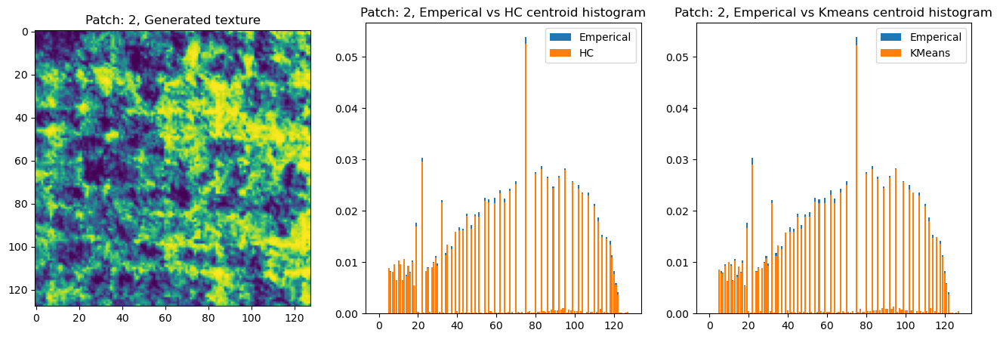

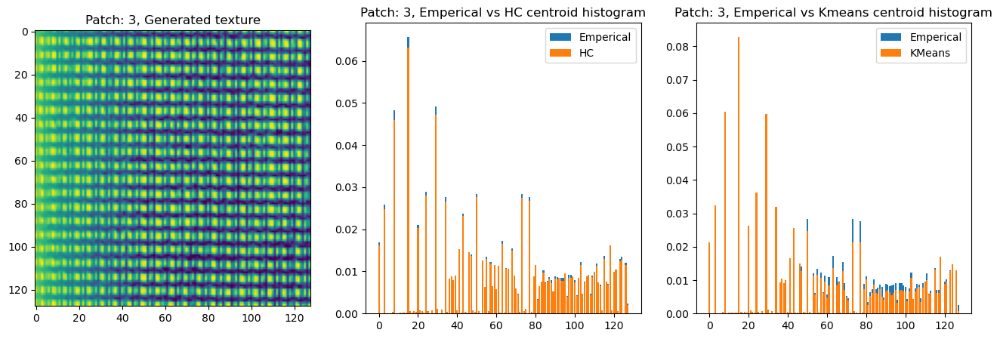

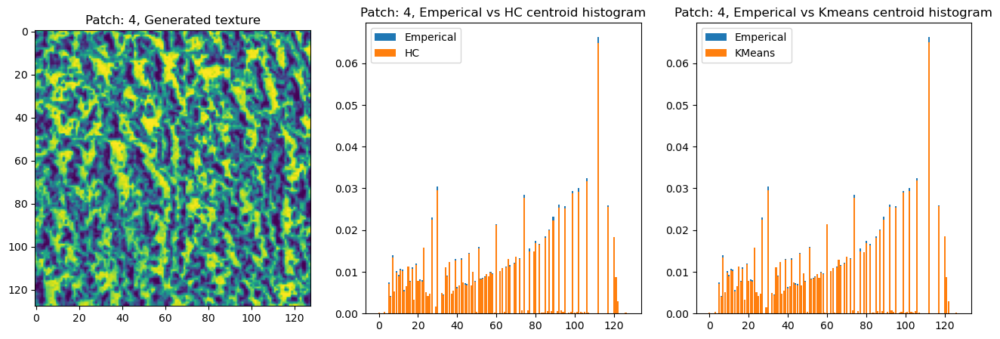

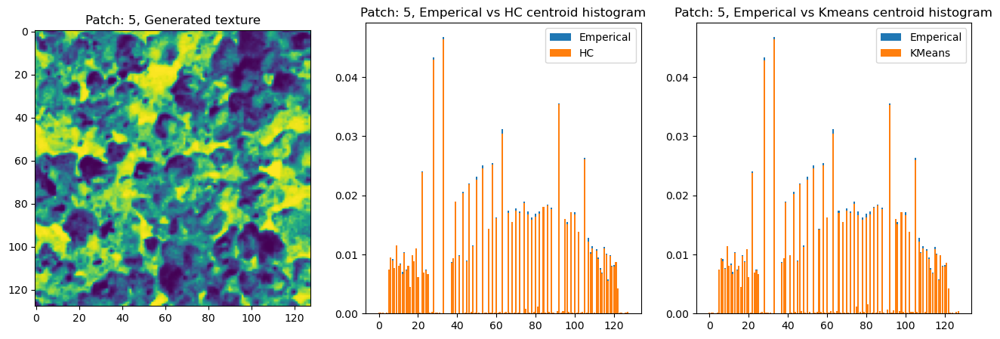

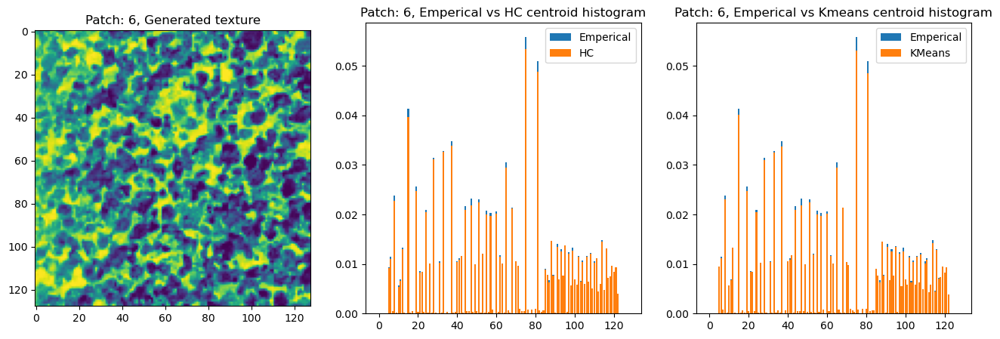

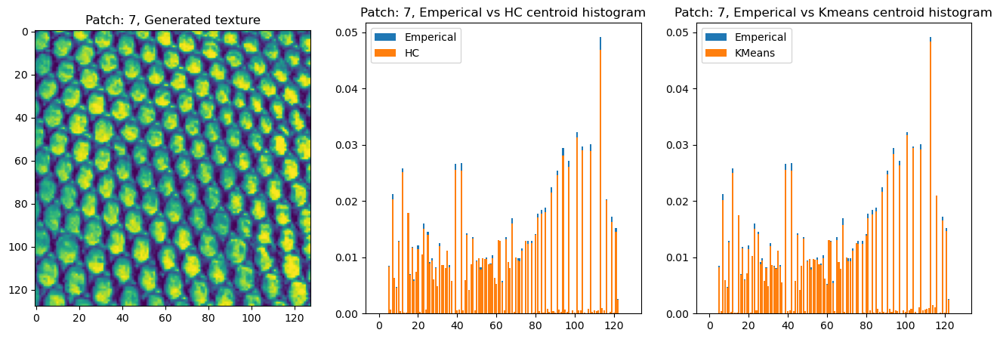

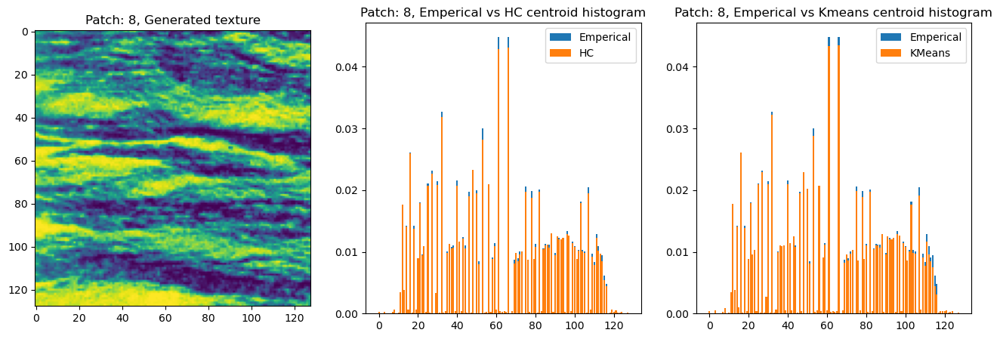

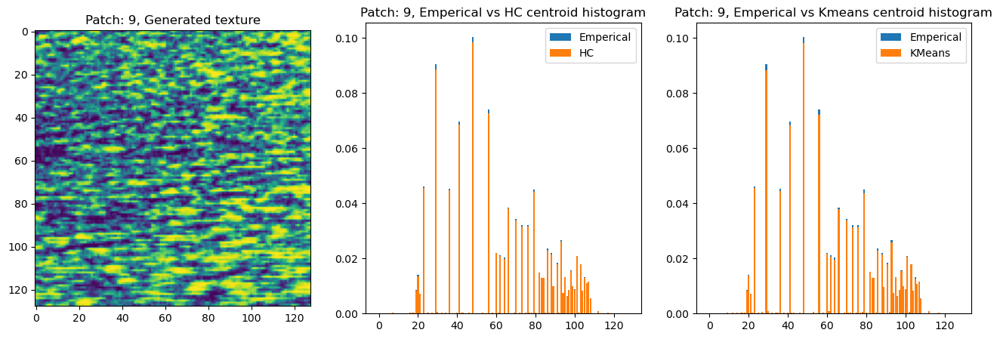

In [77]:
for patch in range(np.prod(patch_grid_shape)):
    i, j = np.unravel_index(patch, patch_grid_shape)
    true_texture = texture[patch_shape[0] * i:patch_shape[0] * (i + 1), patch_shape[1] * j:patch_shape[1] * (j + 1)] 

    hist_emperical = HC.create_hist(true_texture)
    hist_KM = KM.cluster_centers_[list(cluster_map_km.values()).index(patch)]
    hist_HC = HC.centroids[list(cluster_map_hc.values()).index(patch)]
    
    plt.figure(figsize=(16,5))
    plt.subplot(131)
    plt.imshow(true_texture)
    plt.title('Patch: ' + str(patch) + ', Generated texture')
    plt.subplot(132)
    plt.bar(np.arange(HC.n_bins), hist_emperical, label = 'Emperical')
    plt.bar(np.arange(HC.n_bins), hist_HC, label = 'HC')
    plt.title('Patch: ' + str(patch) + ', Emperical vs HC centroid histogram')
    plt.legend()
    plt.subplot(133)
    plt.bar(np.arange(HC.n_bins), hist_emperical, label = 'Emperical')
    plt.bar(np.arange(HC.n_bins), hist_KM, label = 'KMeans')
    plt.title('Patch: ' + str(patch) + ', Emperical vs Kmeans centroid histogram')
    plt.legend()
    plt.show()


<h2 style="background-color:#f0b375;">
Section 6.0 
<span style=font-size:50%> Complete all problems in this and previous sections to get a grade of 6.0 </span>
</h2>

<ul style="background-color:#adebad;">
        <li>
        Implement the "DA" part of HC.fit.
        </li>
    </ul>

<ul style="background-color:#adebad;">
        <li>
        Plot the clustering (predicted labels) of the texture (perm_texture) at different temperatures during the annealing schedule. Describe what you observe.
        </li>
    </ul>

As expected, higher temperature levels lead to a lower number of effective clusters. By lowering the temperature below certain thresholds, the number of effective clusters increases. Starting with a temperature of 0.5, the DA identifies two effective clusters. The number of effective clusters then increases to three and four by lowering the temperature to 0.4 and 0.3, respectively. By further lowering the temperature below 0.2, the algorithm already identifies all final clusters. Subsequently, it just refines the texture borders of the final clusters. The DA implementation performs slightly better than MAP.

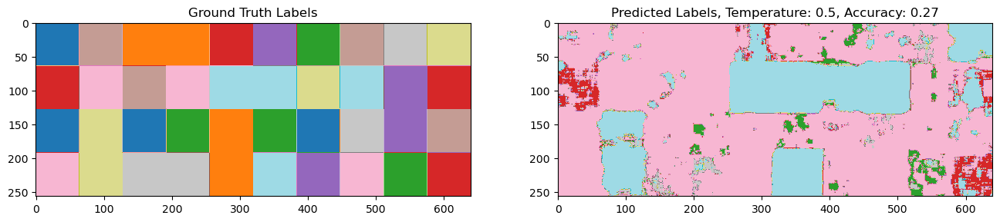

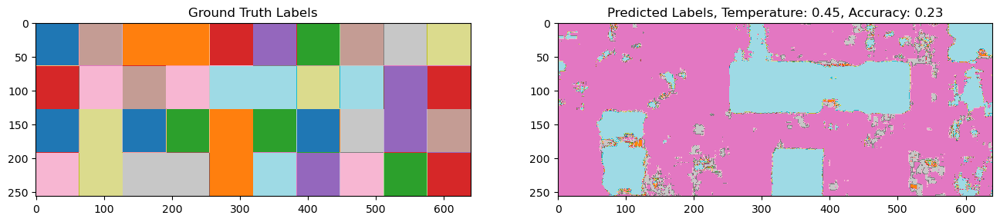

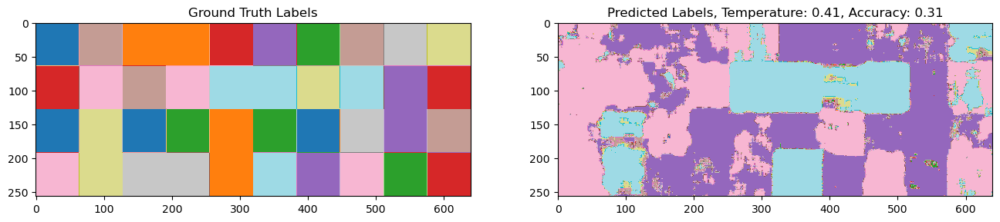

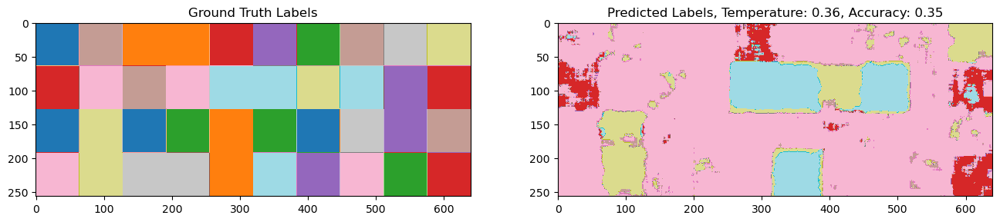

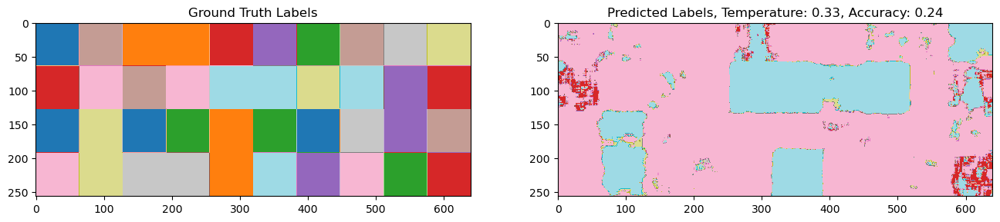

...

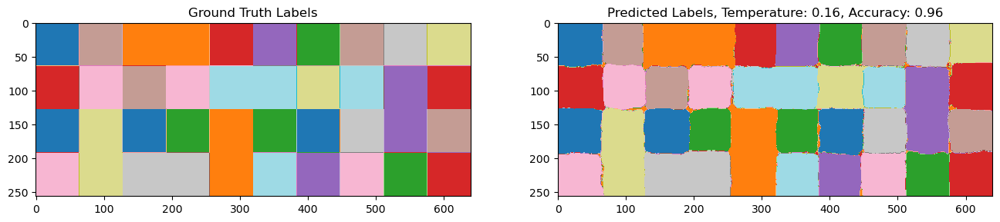

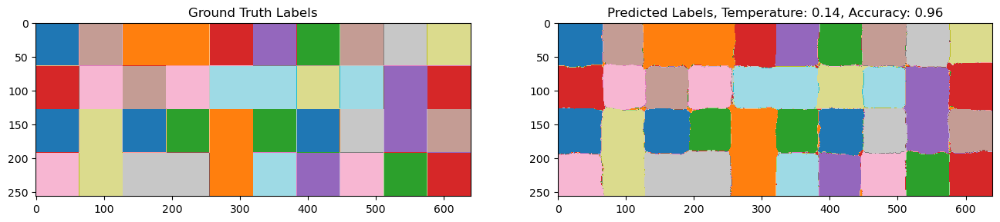

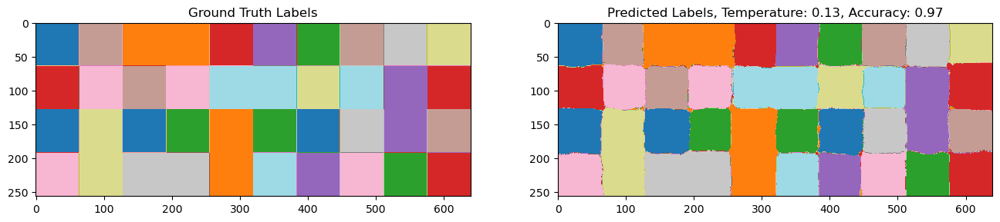

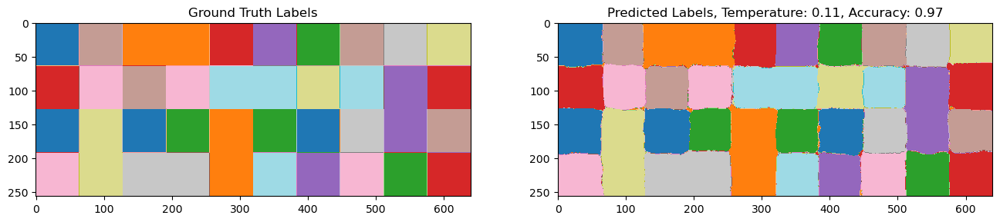

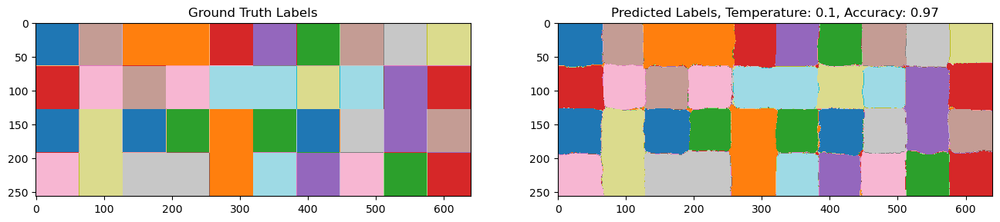

CPU times: user 24min 35s, sys: 20min 53s, total: 45min 29s
Wall time: 49min 49s


In [57]:
%%time
HC = HistogramClustering(estimation="DA", n_bins=128, window_size=15, T = 0.5, T_min = 0.1, alpha = 0.9, plot_clust = True)
HC.fit(texture)
check_is_fitted(HC, ["centroids"])

## Comments

We hope you found this exercise instructive.

Feel free to leave comments below, we will read them carefully.